In [1]:
import sys, os
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn

# local_path = '/Users/juniorcedrictonga/Documents/pgm/Score-matching-project-'
local_path = '/Users/halvardbariller/Desktop/M2_MVA/_SEMESTER_1/PGM/Project/Score-matching-project-'
sys.path.append(local_path)

%load_ext autoreload
%autoreload 2

import dataset
from dataset import sampling, densities, scores, visualisation
from dataset.sampling import Discrete
import score_matching
from score_matching import toy_models, learning_objectives, score_visualisation
import mcmc_sampling
from mcmc_sampling import langevin, dynamics_plot, interacting_mcmc


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

### Star distribution

In [31]:
star_sampler = Discrete(center_star=[0,0], size_star = 1, m_start = 250, scale=0.01)
star_data, clusters_star = star_sampler.sample_with_clusters(10000)

## NCSN : impact of differents level of noises

## $L = 1$

In [32]:
num_levels = 1

In [33]:
# Parameters

learning_rate = 1e-3
num_epochs = 1000

sigma_begin = 1 
sigma_end = 0.01

## vector of num_classes of sigmas to use for data pertubation 
noise_levels = torch.tensor(np.exp(np.linspace(np.log(sigma_begin), np.log(sigma_end), num_levels))).float() 

# Our approximation model
ncsn_1_noise = toy_models.ConditionalModel(num_levels)

# Learning objective
optimizer = torch.optim.Adam(ncsn_1_noise.parameters(), lr=learning_rate)
ScoreMatching = learning_objectives.ScoreMatching(optimizer, 'anneal_denoising_score_matching', device, sigma = noise_levels) # sigmas here is for data's pertubation 

# Training
ScoreMatching.train(star_data, ncsn_1_noise, num_epochs, verbose=False, plot=False)

  0%|          | 0/1000 [00:00<?, ?it/s]

100%|██████████| 1000/1000 [00:16<00:00, 59.96it/s]

Training finished!


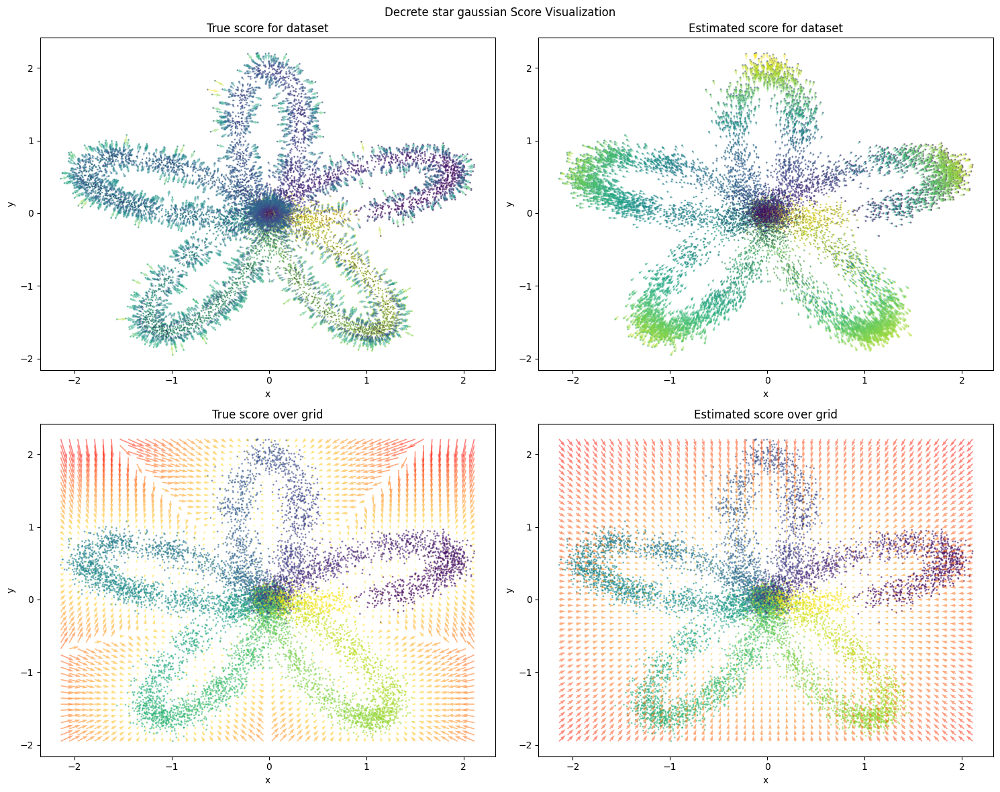

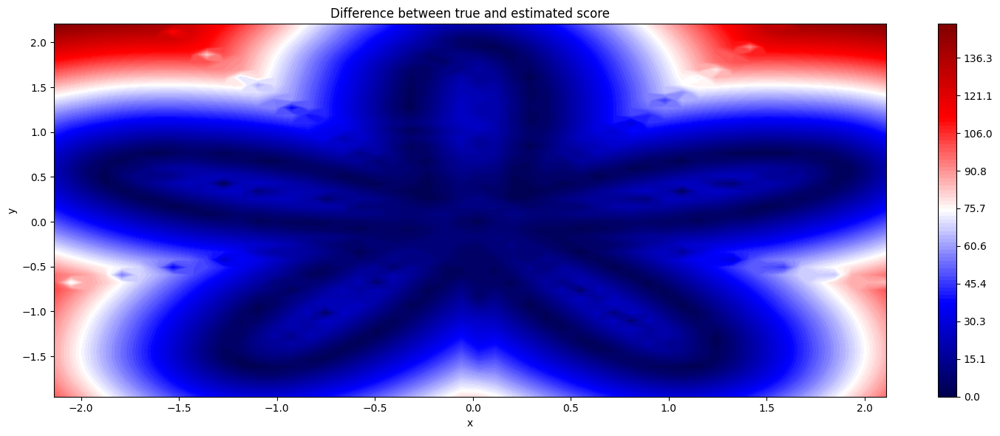

In [34]:
star_sampler.plot_estimated_score_star(star_data, clusters_star, ncsn_1_noise, difference=True, 
                                  type='anneal_denoising_score_matching', sigma_list= noise_levels)

In [35]:
step = 1e-4
iterations = 300
n_samples = 10000

target_samples_annealed, hist_samples_annealed = interacting_mcmc.annealed_langevin(ncsn_1_noise, step, noise_levels, 
                                                                                    iterations, n_samples, **{'data_type':'star'})

100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


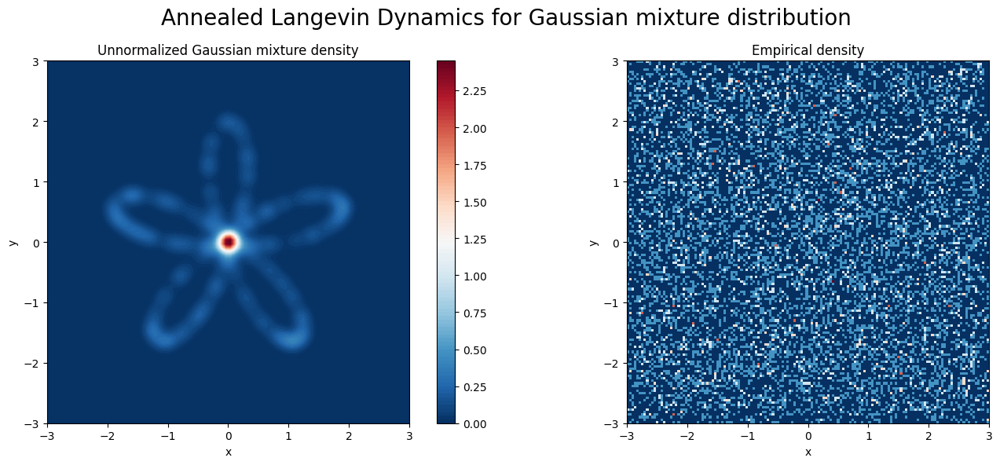

In [36]:
dynamics_plot.langevin_sampling_star(target_samples_annealed, star_sampler, annealed=True)

## $ L = 2$

In [37]:
num_levels = 2

In [38]:
# Parameters

learning_rate = 1e-3
num_epochs = 1000

sigma_begin = 1 
sigma_end = 0.01

## vector of num_classes of sigmas to use for data pertubation 
noise_levels = torch.tensor(np.exp(np.linspace(np.log(sigma_begin), np.log(sigma_end), num_levels))).float() 

# Our approximation model
ncsn_2_noise = toy_models.ConditionalModel(num_levels)

# Learning objective
optimizer = torch.optim.Adam(ncsn_2_noise.parameters(), lr=learning_rate)
ScoreMatching = learning_objectives.ScoreMatching(optimizer, 'anneal_denoising_score_matching', device, sigma = noise_levels) # sigmas here is for data's pertubation 

# Training
ScoreMatching.train(star_data, ncsn_2_noise, num_epochs, verbose=False, plot=False)

  0%|          | 0/1000 [00:00<?, ?it/s]

100%|██████████| 1000/1000 [00:17<00:00, 56.70it/s]

Training finished!


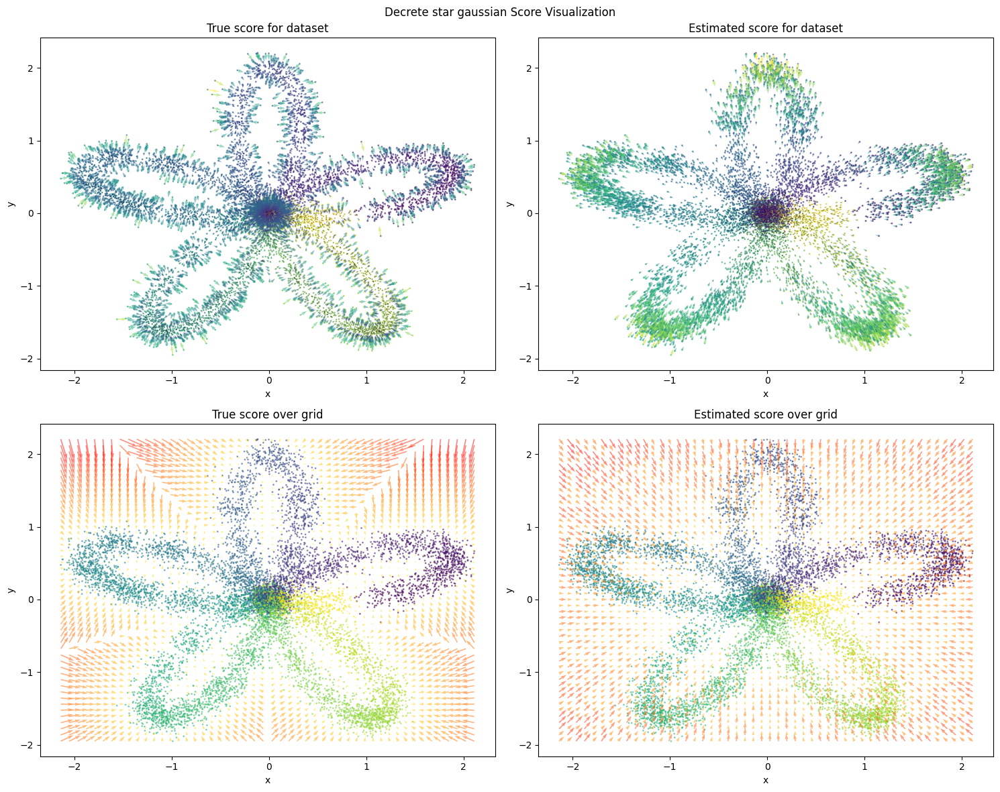

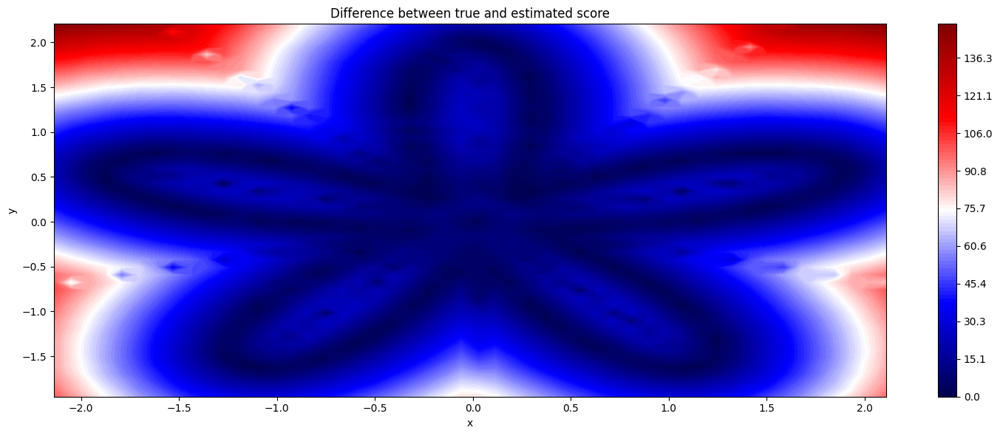

In [39]:
star_sampler.plot_estimated_score_star(star_data, clusters_star, ncsn_2_noise, difference=True, 
                                  type='anneal_denoising_score_matching', sigma_list= noise_levels)

In [40]:
step = 1e-4
iterations = 300
n_samples = 10000

target_samples_annealed, hist_samples_annealed = interacting_mcmc.annealed_langevin(ncsn_2_noise, step, noise_levels, 
                                                                                    iterations, n_samples, **{'data_type':'star'})

100%|██████████| 2/2 [00:05<00:00,  2.68s/it]


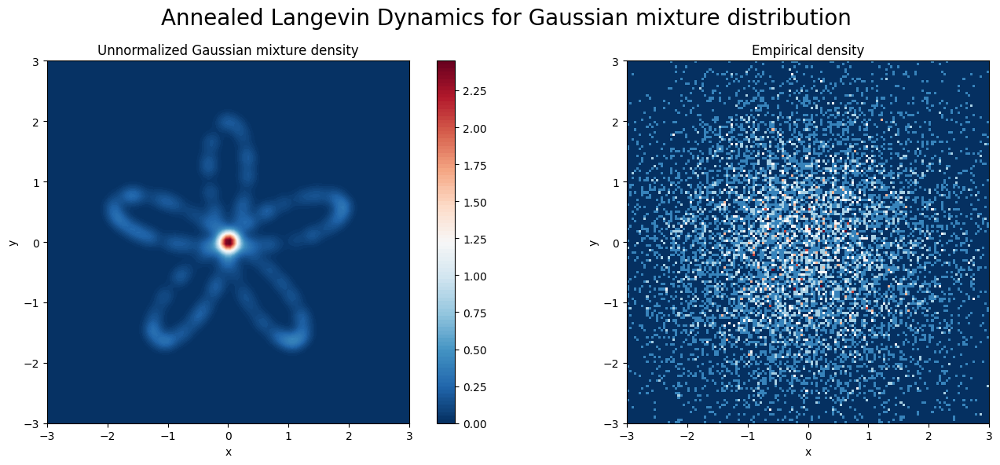

In [41]:
dynamics_plot.langevin_sampling_star(target_samples_annealed, star_sampler, annealed=True)

## $L = 5$

In [42]:
num_levels = 5

In [44]:
# Parameters

learning_rate = 1e-3
num_epochs = 1000

sigma_begin = 1 
sigma_end = 0.01

## vector of num_classes of sigmas to use for data pertubation 
noise_levels = torch.tensor(np.exp(np.linspace(np.log(sigma_begin), np.log(sigma_end), num_levels))).float() 

# Our approximation model
ncsn_5_noise = toy_models.ConditionalModel(num_levels)

# Learning objective
optimizer = torch.optim.Adam(ncsn_5_noise.parameters(), lr=learning_rate)
ScoreMatching = learning_objectives.ScoreMatching(optimizer, 'anneal_denoising_score_matching', device, sigma = noise_levels) # sigmas here is for data's pertubation 

# Training
ScoreMatching.train(star_data, ncsn_5_noise, num_epochs, verbose=False, plot=False)

100%|██████████| 1000/1000 [00:17<00:00, 57.62it/s]

Training finished!


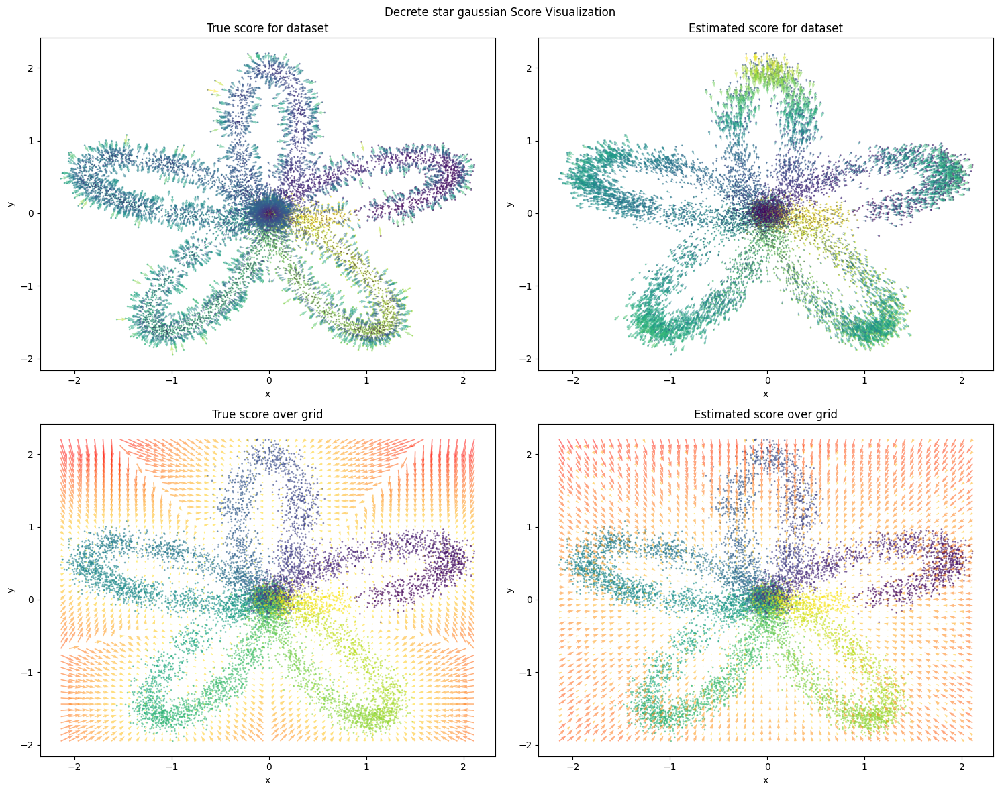

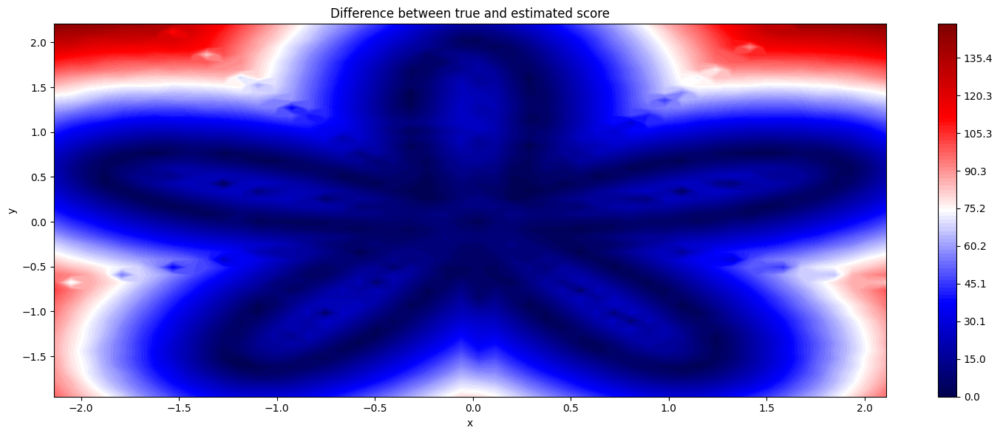

In [45]:
star_sampler.plot_estimated_score_star(star_data, clusters_star, ncsn_5_noise, difference=True, 
                                  type='anneal_denoising_score_matching', sigma_list= noise_levels)

In [46]:
step = 1e-4
iterations = 300
n_samples = 10000

target_samples_annealed, hist_samples_annealed = interacting_mcmc.annealed_langevin(ncsn_5_noise, step, noise_levels, 
                                                                                    iterations, n_samples, **{'data_type':'star'})

100%|██████████| 5/5 [00:13<00:00,  2.63s/it]


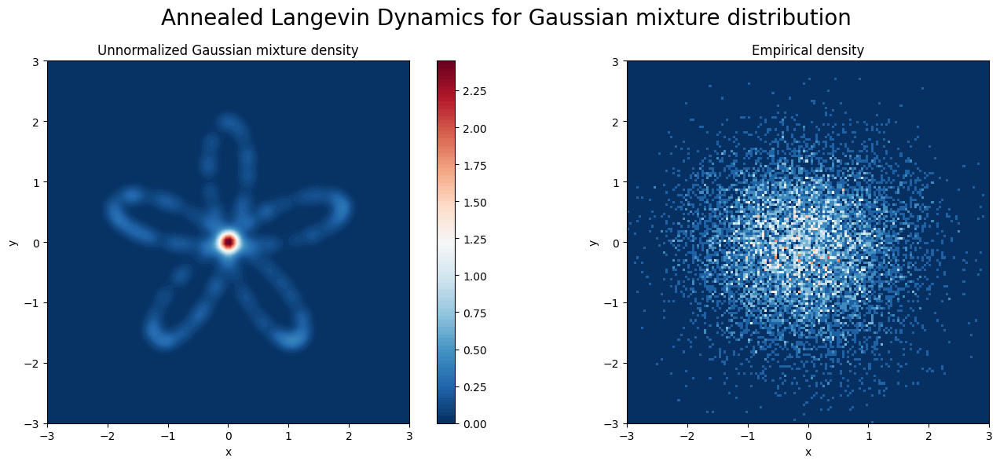

In [47]:
dynamics_plot.langevin_sampling_star(target_samples_annealed, star_sampler, annealed=True)

## $L = 10$

In [48]:
num_levels = 10

In [49]:
# Parameters

learning_rate = 1e-3
num_epochs = 1000

sigma_begin = 1 
sigma_end = 0.01

## vector of num_classes of sigmas to use for data pertubation 
noise_levels = torch.tensor(np.exp(np.linspace(np.log(sigma_begin), np.log(sigma_end), num_levels))).float() 

# Our approximation model
ncsn_10_noise = toy_models.ConditionalModel(num_levels)

# Learning objective
optimizer = torch.optim.Adam(ncsn_10_noise.parameters(), lr=learning_rate)
ScoreMatching = learning_objectives.ScoreMatching(optimizer, 'anneal_denoising_score_matching', device, sigma = noise_levels) # sigmas here is for data's pertubation 

# Training
ScoreMatching.train(star_data, ncsn_10_noise, num_epochs, verbose=False, plot=False)

  0%|          | 0/1000 [00:00<?, ?it/s]

100%|██████████| 1000/1000 [00:17<00:00, 58.30it/s]

Training finished!


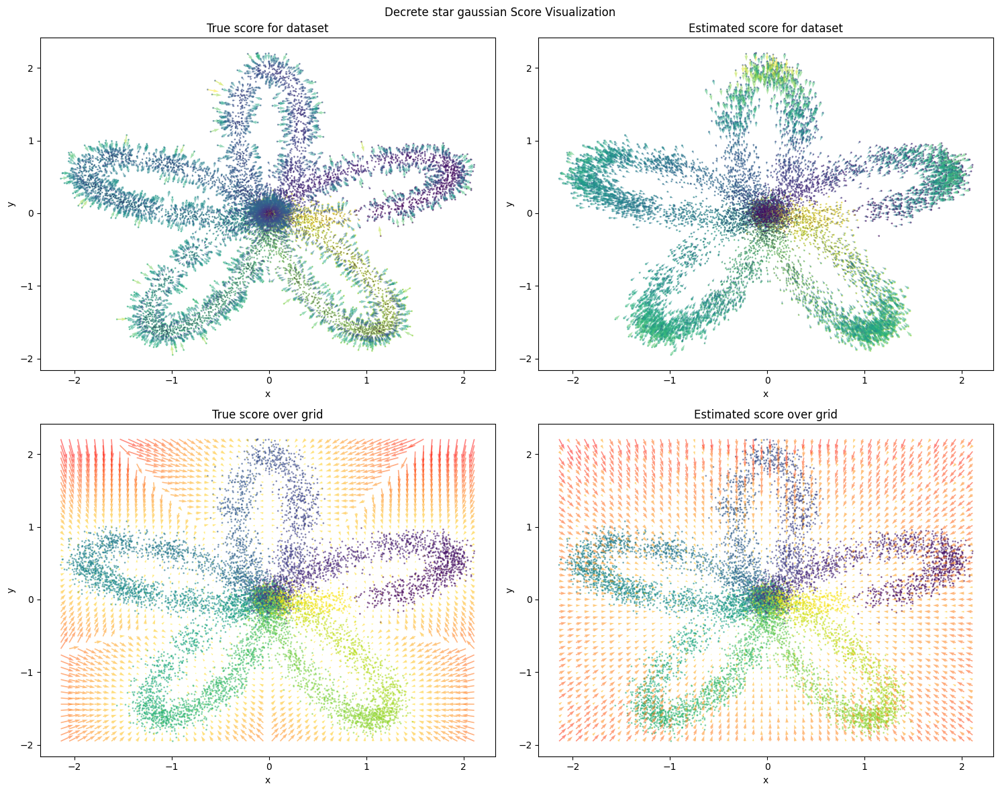

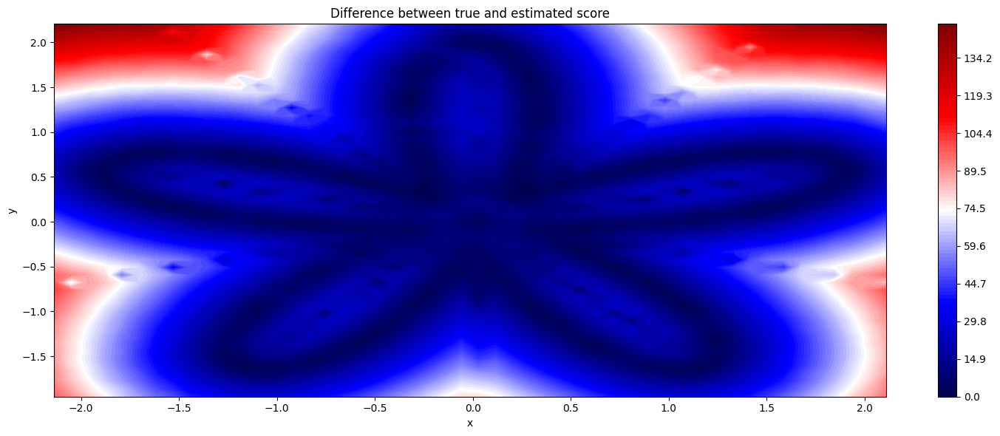

In [50]:
star_sampler.plot_estimated_score_star(star_data, clusters_star, ncsn_10_noise, difference=True, 
                                  type='anneal_denoising_score_matching', sigma_list= noise_levels)

In [51]:
step = 1e-4
iterations = 300
n_samples = 10000

target_samples_annealed, hist_samples_annealed = interacting_mcmc.annealed_langevin(ncsn_10_noise, step, noise_levels, 
                                                                                    iterations, n_samples, **{'data_type':'star'})

100%|██████████| 10/10 [00:25<00:00,  2.54s/it]


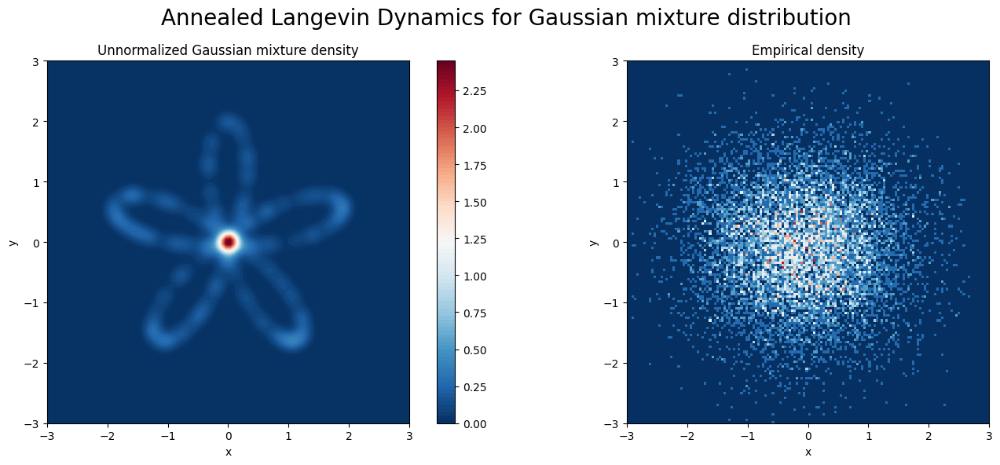

In [52]:
dynamics_plot.langevin_sampling_star(target_samples_annealed, star_sampler, annealed=True)

## $L = 20$

In [53]:
num_levels = 20

In [54]:
# Parameters

learning_rate = 1e-3
num_epochs = 1000

sigma_begin = 1 
sigma_end = 0.01

## vector of num_classes of sigmas to use for data pertubation 
noise_levels = torch.tensor(np.exp(np.linspace(np.log(sigma_begin), np.log(sigma_end), num_levels))).float() 

# Our approximation model
ncsn_20_noise = toy_models.ConditionalModel(num_levels)

# Learning objective
optimizer = torch.optim.Adam(ncsn_1_noise.parameters(), lr=learning_rate)
ScoreMatching = learning_objectives.ScoreMatching(optimizer, 'anneal_denoising_score_matching', device, sigma = noise_levels) # sigmas here is for data's pertubation 

# Training
ScoreMatching.train(star_data, ncsn_20_noise, num_epochs, verbose=False, plot=False)

  0%|          | 0/1000 [00:00<?, ?it/s]

100%|██████████| 1000/1000 [00:16<00:00, 62.29it/s]

Training finished!


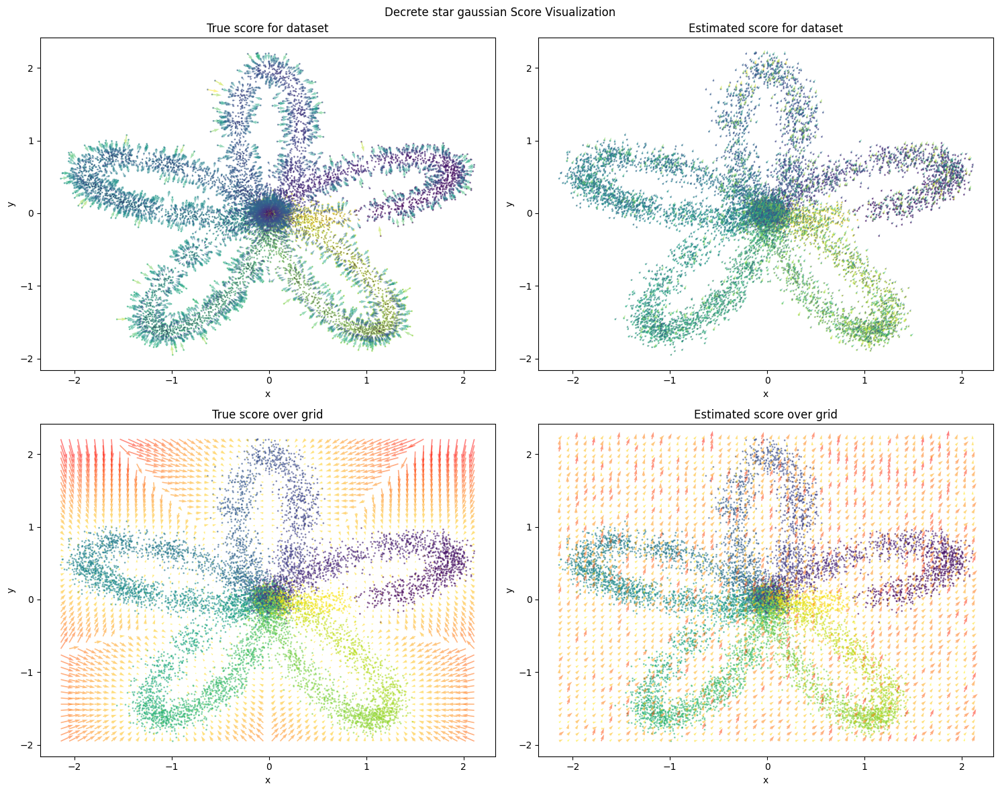

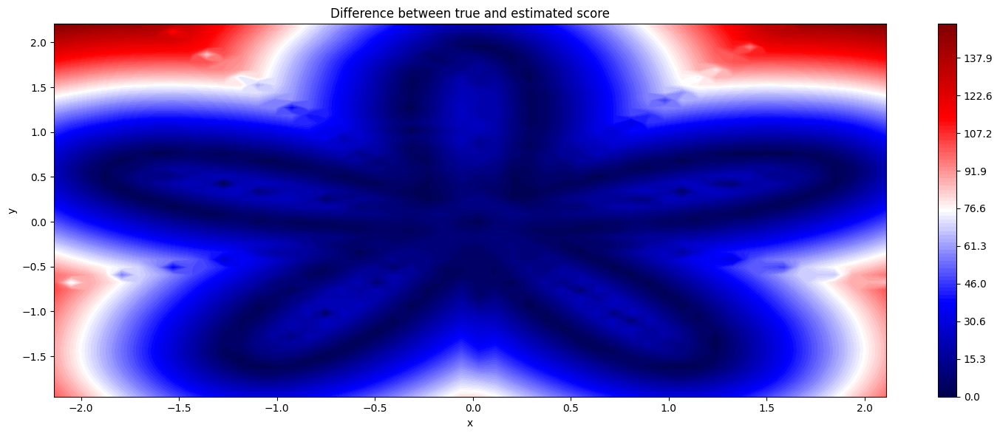

In [55]:
star_sampler.plot_estimated_score_star(star_data, clusters_star, ncsn_20_noise, difference=True, 
                                  type='anneal_denoising_score_matching', sigma_list= noise_levels)

In [56]:
step = 1e-4
iterations = 300
n_samples = 10000

target_samples_annealed, hist_samples_annealed = interacting_mcmc.annealed_langevin(ncsn_20_noise, step, noise_levels, 
                                                                                    iterations, n_samples, **{'data_type':'star'})

100%|██████████| 20/20 [00:40<00:00,  2.03s/it]


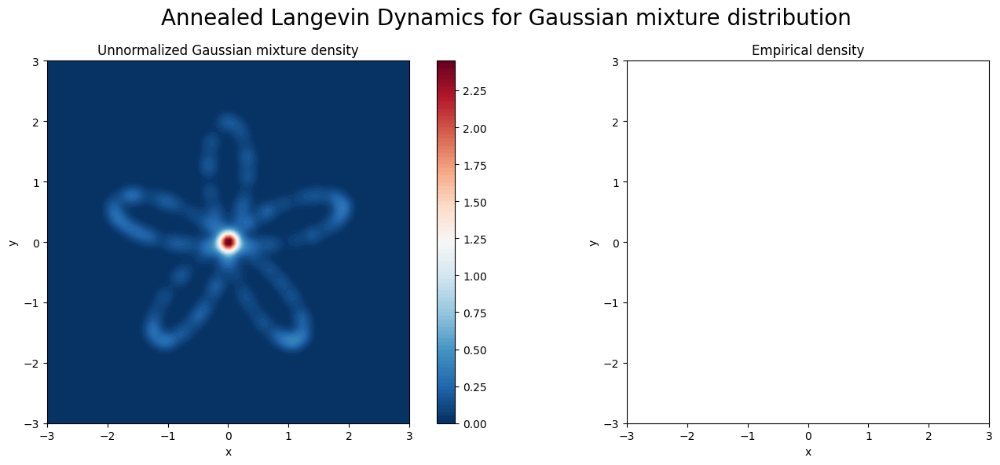

In [57]:
dynamics_plot.langevin_sampling_star(target_samples_annealed, star_sampler, annealed=True)

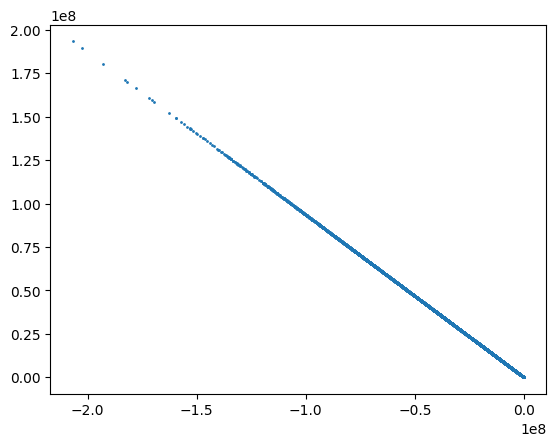

In [58]:
plt.scatter(target_samples_annealed[:,0], target_samples_annealed[:,1], s=1)